In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "1"

import rasterio
from matplotlib import pyplot as plt
import numpy as np

import keras
from segmentation_models import Unet
import cv2

Using TensorFlow backend.
/opt/conda/lib/python3.6/site-packages/classification_models/resnext/__init__.py:4: UserWarning: Current ResNext models are deprecated, use keras.applications ResNeXt models
  warnings.warn('Current ResNext models are deprecated, '


# We use the existing model
## U-Resnet-34 for forest segmentation.

This model is trained on 2m images, so on 0.5m images it may be useful for distinguishing between the trees and other

In [2]:
base_model = keras.models.load_model('/home/user/data/Models/ForestSegmentationModel_ITC.h5')

/opt/conda/lib/python3.6/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


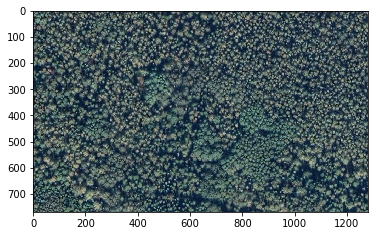

In [3]:
with rasterio.open('/home/user/data/ITC_dataset/perm1_marked/orthophoto.tif') as src:
    img = src.read().transpose(1, 2,0)
    
plt.imshow(img)
plt.show()

In [4]:
img.shape

(769, 1281, 3)

(1024, 2048, 3)


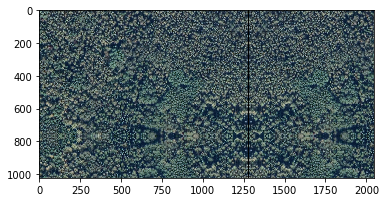

In [5]:
pad_0 = 1024 - img.shape[0]
pad_1 = 2048 - img.shape[1]
img_pad = np.pad(img, pad_width=((0, pad_0),(0, pad_1),(0,0)), mode='reflect')
print(img_pad.shape)
plt.imshow(img_pad)
plt.show()

In [6]:
mask = base_model.predict(np.array([img_pad]))
mask.shape

(1, 1024, 2048, 1)

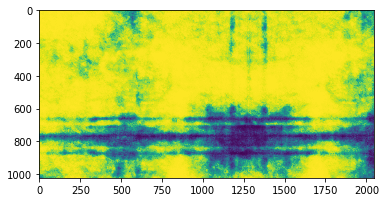

In [7]:
# The initial model shows certain 'Forest' response and it is good
plt.imshow(mask[0,0:img_pad.shape[0],0:img_pad.shape[1],0] )
plt.show()

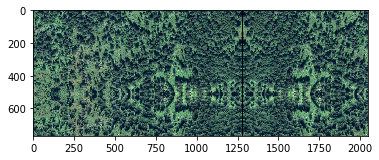

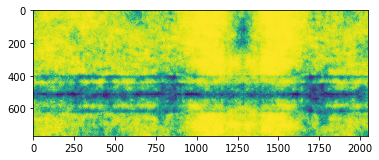

In [8]:
# Try other image with unforested areas
with rasterio.open('/home/user/data/ITC_dataset/irkutsk2_marked/orthophoto.tif') as src:
    img = src.read().transpose(1,2,0)

img_pad = np.pad(img, pad_width=((0, pad_0),(0, pad_1),(0,0)), mode='reflect')

plt.imshow(img_pad)
plt.show()

mask = base_model.predict(np.array([img_pad]))
plt.imshow(mask[0,0:img_pad.shape[0],0:img_pad.shape[1],0])
plt.show()

# We will train the model on the ITC data 
- change the head
- fix all weights except head
- then fine-tune all the weights until it overfits
- profit?

In [9]:
# new head
x = keras.layers.Conv2D(3, (1,1))(base_model.layers[-1].layers[-3].output)
out = keras.layers.Activation(activation='softmax')(x)

inner_model = keras.models.Model(inputs=[base_model.layers[-1].layers[0].input], outputs=[out])

In [10]:
# Attach lambda layer
y = inner_model(base_model.layers[1].output)
model = keras.models.Model(inputs=[base_model.layers[0].input], outputs=[y])

In [11]:
# Train just as is
import albumentations as alb

train_transform = alb.Compose([
    
    alb.HorizontalFlip(p=0.5),
    # blur
    alb.OneOf([
            alb.MotionBlur(p=.2),
            alb.MedianBlur(blur_limit=3, p=0.1),
            alb.Blur(blur_limit=3, p=0.1),
        ], p=0.2),
    # color transforms
    alb.OneOf(
        [
            alb.RandomBrightnessContrast(always_apply=True),
            alb.RandomGamma(always_apply=True),
            alb.HueSaturationValue(always_apply=True),
            alb.IAASharpen(always_apply=True),
            alb.CLAHE(clip_limit=2),
            alb.IAASharpen(),
        ],
    p=0.5),
    
    # geometric transforms
    alb.OneOf(
        [
            alb.RandomScale(scale_limit=(-0.2, 0.2), always_apply=True),
            alb.GridDistortion(p=.1),
            alb.IAAPiecewiseAffine(p=0.3),
            #alb.IAAPiecewiseAffine(always_apply=True),
        ],
    p=0.5),
    alb.RandomCrop(256,256)
], p=1.)


In [12]:
class myGen:
    def __init__(self, image, trees, bound, bg, crop_size=256, batch_size=16):
        self.batch_size=batch_size
        self.image=rasterio.open(image)
        self.trees=rasterio.open(trees)
        self.bound=rasterio.open(bound)
        self.bg=rasterio.open(bg)
        self.shape=(self.image.height, self.image.width)
        self.crop_size = crop_size
    def __iter__(self):
        return self

    def __next__(self):
        x = []
        y = []
        for s in range(self.batch_size):
            # generate random crop
            minrow = np.random.randint(0, self.shape[0] - self.crop_size - 1)
            maxrow = minrow + self.crop_size
            mincol = np.random.randint(0, self.shape[1] - self.crop_size - 1)
            maxcol = mincol + self.crop_size
            #read image and masks
            window=((minrow,maxrow), (mincol,maxcol))
            
            x.append(self.image.read(window=window).transpose(1,2,0))
            tree_m = self.trees.read(1,window=window)
            bound_m = self.bound.read(1,window=window)
            bg_m = self.bg.read(1,window=window)
            y.append(np.array([tree_m, bound_m, bg_m]).transpose(1,2,0))
        return np.array(x),np.array(y)

In [14]:
DIR = '/home/user/data/ITC_dataset/Perm1/'
gen = myGen(image=DIR + 'orthophoto.tif',
           trees=DIR + 'trees_marked2.tif',
           bound=DIR + 'bounds_marked2.tif',
           bg=DIR + 'bg_marked2.tif')

In [15]:
gen.__next__()[1].shape

(16, 256, 256, 3)

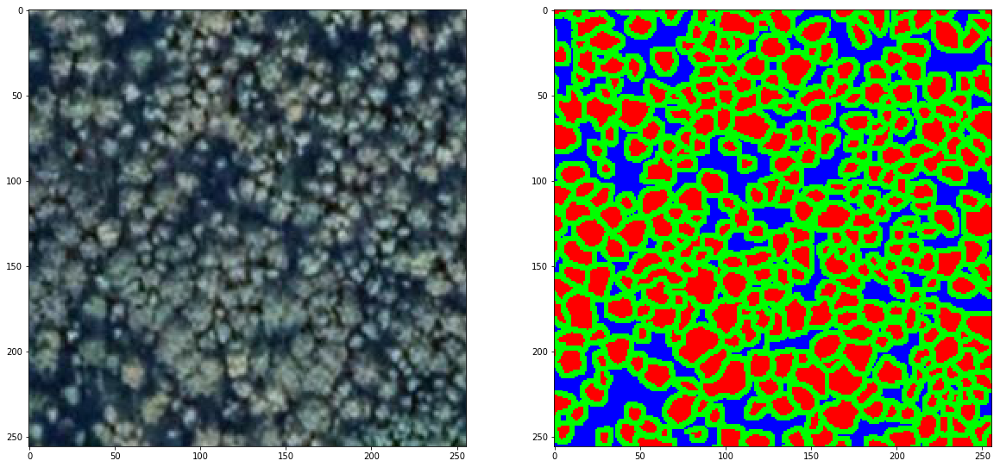

In [17]:
imgs, masks = gen.__next__()
img = imgs[0]
mask=masks[0]

plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.imshow(mask*255)
plt.show()



In [18]:
opt = keras.optimizers.Adam(lr=0.0001)
    #
loss = keras.losses.categorical_crossentropy
metrics = [keras.metrics.categorical_crossentropy]
model.compile(optimizer=opt, loss=loss, metrics=metrics)


In [19]:
history = model.fit_generator(gen,
                              steps_per_epoch=100,
                              validation_data=gen,
                              validation_steps=50,
                              epochs=10)

Epoch 1/10
100/100 [==============================] - 21s 215ms/step - loss: 0.8777 - categorical_crossentropy: 0.8777 - val_loss: 0.6785 - val_categorical_crossentropy: 0.6785
Epoch 2/10
100/100 [==============================] - 19s 188ms/step - loss: 0.6190 - categorical_crossentropy: 0.6190 - val_loss: 0.6857 - val_categorical_crossentropy: 0.6857
Epoch 3/10
100/100 [==============================] - 19s 188ms/step - loss: 0.5439 - categorical_crossentropy: 0.5439 - val_loss: 0.6517 - val_categorical_crossentropy: 0.6517
Epoch 4/10
100/100 [==============================] - 19s 189ms/step - loss: 0.4949 - categorical_crossentropy: 0.4949 - val_loss: 0.5701 - val_categorical_crossentropy: 0.5701
Epoch 5/10
100/100 [==============================] - 19s 189ms/step - loss: 0.4561 - categorical_crossentropy: 0.4561 - val_loss: 0.4901 - val_categorical_crossentropy: 0.4901
Epoch 6/10
100/100 [==============================] - 19s 189ms/step - loss: 0.4220 - categorical_crossentropy: 0.4

In [39]:
from keras import backend as K
def _iou_score(gt, pr, class_weights=1., smooth=1e-12):
    axes = [1, 2]

    intersection = K.sum(gt * pr, axis=axes)
    union = K.sum(gt + pr, axis=axes) - intersection
    iou = (intersection + smooth) / (union + smooth)

    # mean per image
    iou = K.mean(iou, axis=0)

    # weighted mean per class
    iou = K.mean(iou * class_weights)

    return iou


def iou_score(gt, pr):
    return _iou_score(gt, pr, class_weights=1., smooth=1e-12)


In [40]:
opt = keras.optimizers.Adam(lr=0.00001)

metrics = [iou_score]
model.compile(optimizer=opt, loss=loss, metrics=metrics)
history = model.fit_generator(gen,
                              steps_per_epoch=100,
                              validation_data=gen,
                              validation_steps=50,
                              epochs=20,
                              initial_epoch=10)

Epoch 11/20
100/100 [==============================] - 21s 210ms/step - loss: 0.2844 - iou_score: 0.6895 - val_loss: 0.2874 - val_iou_score: 0.6878
Epoch 12/20
100/100 [==============================] - 19s 194ms/step - loss: 0.2851 - iou_score: 0.6897 - val_loss: 0.2859 - val_iou_score: 0.6898
Epoch 13/20
100/100 [==============================] - 19s 195ms/step - loss: 0.2840 - iou_score: 0.6910 - val_loss: 0.2820 - val_iou_score: 0.6927
Epoch 14/20
100/100 [==============================] - 19s 195ms/step - loss: 0.2831 - iou_score: 0.6922 - val_loss: 0.2819 - val_iou_score: 0.6941
Epoch 15/20
100/100 [==============================] - 20s 195ms/step - loss: 0.2816 - iou_score: 0.6942 - val_loss: 0.2789 - val_iou_score: 0.6961
Epoch 16/20
100/100 [==============================] - 20s 196ms/step - loss: 0.2817 - iou_score: 0.6942 - val_loss: 0.2787 - val_iou_score: 0.6965
Epoch 17/20
100/100 [==============================] - 20s 196ms/step - loss: 0.2786 - iou_score: 0.6968 - val_l

In [41]:
def predict(model, image_name):
    with rasterio.open(image_name) as src:
        img = src.read().transpose(1,2,0)
    if img.shape[0] > 1024 or img.shape[1] > 2048:
        print('Too big')
        return None
    pad_0 = 1024 - img.shape[0]
    pad_1 = 2048 - img.shape[1]
    img_pad = np.pad(img, pad_width=((0, pad_0),(0, pad_1),(0,0)), mode='reflect')
    mask = model.predict(np.array([img_pad]))
    return mask[0, :img.shape[0], :img.shape[1]], img

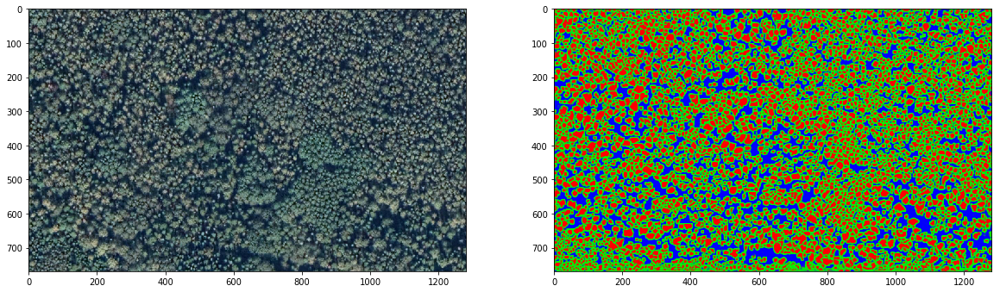

In [44]:
region = 'perm1'
image_name = '/home/user/data/ITC_dataset/Perm1/orthophoto.tif'.format(region)
mask, img = predict(model, image_name)
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.imshow(mask)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


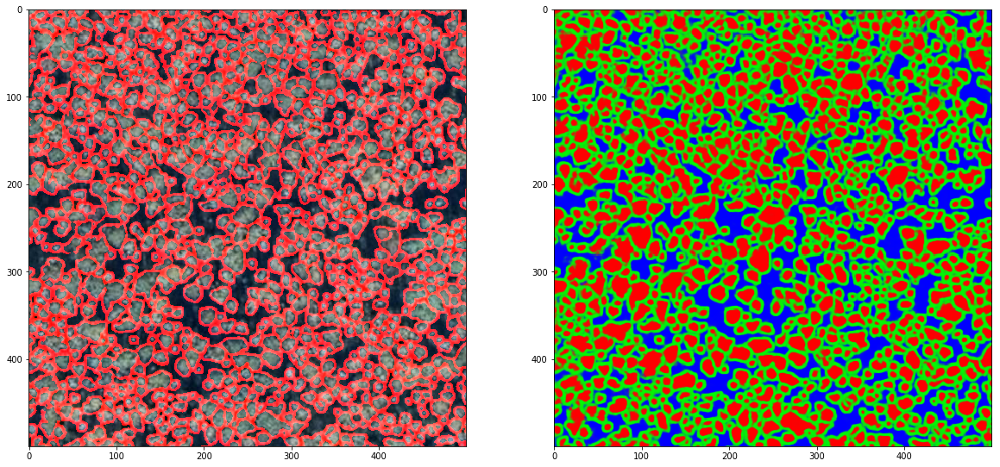

In [45]:
def plot_results(img, mask, miny=0, maxy=-1, minx=0, maxx=-1):
    plt.figure(figsize=(20,10))
    
    img_b = np.array([img[:,:,0].astype(np.uint16) + np.uint16((mask[:, :, 1]>0.5))*255, img[:,:,1] , img[:,:,2]]).transpose(1,2,0)

    plt.subplot(121)
    plt.imshow(img_b[miny:maxy, minx:maxx])
    plt.subplot(122)
    plt.imshow(mask[miny:maxy, minx:maxx])
    plt.show()

plot_results(img, mask, 0,500,0,500)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


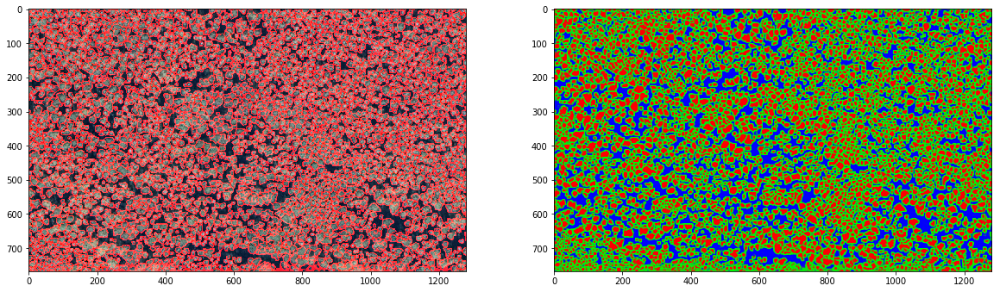

In [46]:
plot_results(img, mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


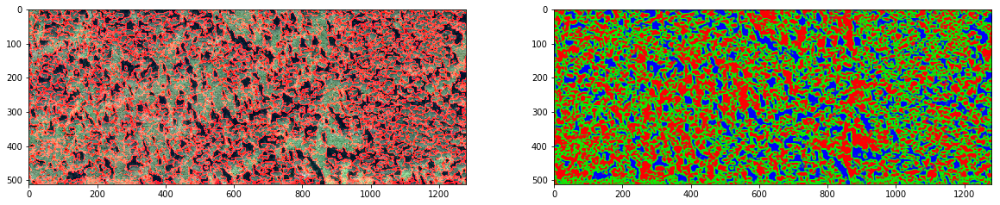

In [48]:
region = 'perm2'
image_name = '/home/user/data/ITC_dataset/Irkutsk2/orthophoto.tif'.format(region)
mask, img = predict(model, image_name)
plot_results(img, mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


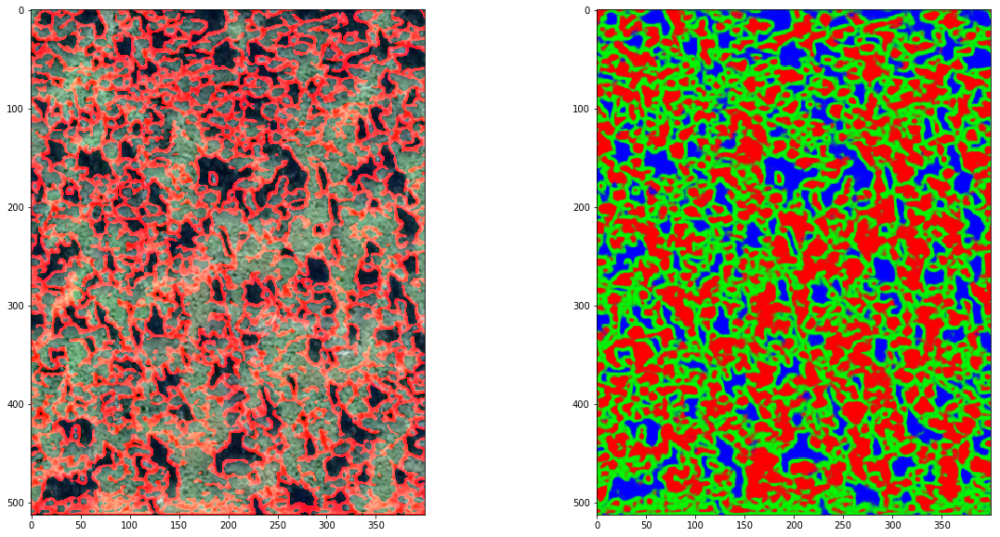

In [50]:
plot_results(img, mask, 0,900,100,500)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


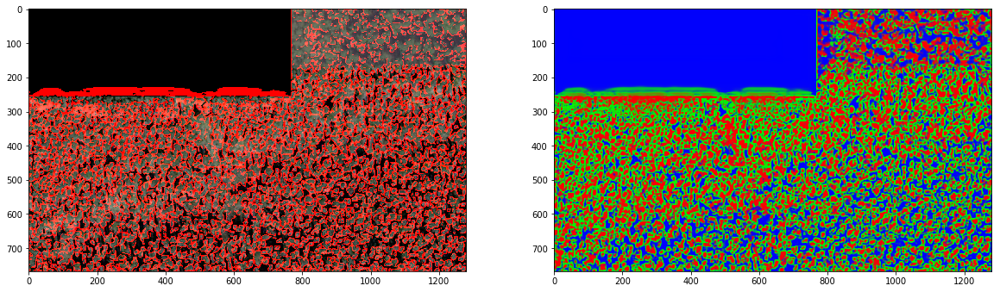

In [51]:
region = 'krsk1'
image_name = '/home/user/data/ITC_dataset/Krsk1/orthophoto.tif'.format(region)
mask, img = predict(model, image_name)
plot_results(img, mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


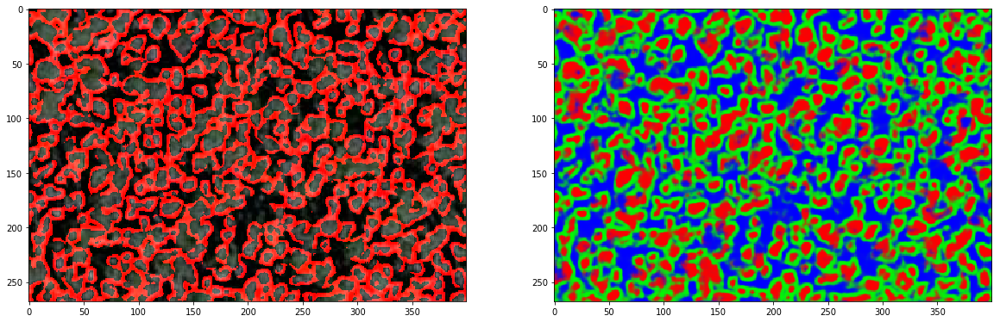

In [52]:
plot_results(img, mask, miny=500, minx=800, maxx=1200)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


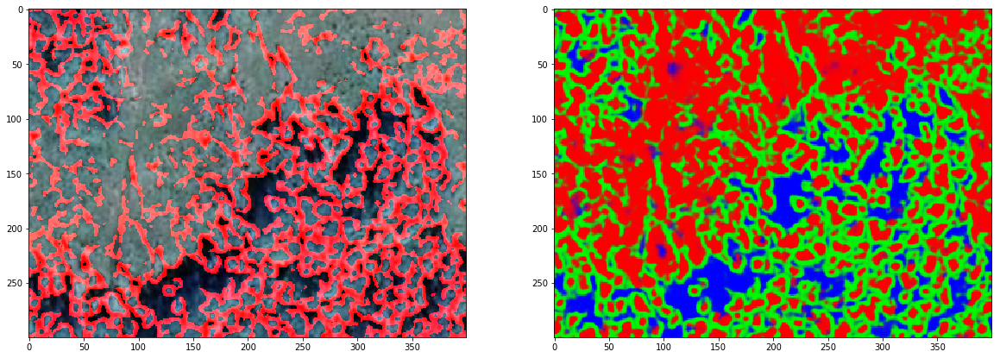

In [53]:
region = 'irkutsk1'
image_name = '/home/user/data/ITC_dataset/Irkutsk1/orthophoto.tif'.format(region)
mask, img = predict(model, image_name)
plot_results(img, mask, miny=200, maxy=500, minx=800, maxx=1200)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


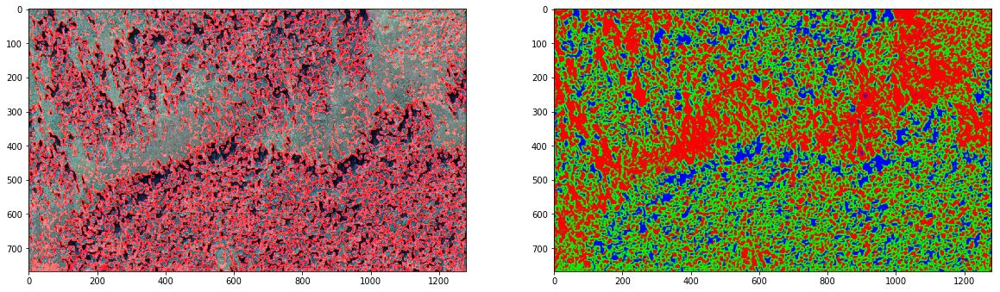

In [54]:
plot_results(img, mask)

# In general, it works. 
## Need more data and good markup at least for validation
## And a better per-object(?) validation metric